# Sentiment Analysis on Fiat Forum Data


Install packages

In [1]:
!pip install transformers pandas torch

import pandas as pd
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from scipy.special import softmax
from tqdm import tqdm


This code sets up a Hugging Face model for sentiment analysis using the "cardiffnlp/twitter-roberta-base-sentiment" model. It initializes both the tokenizer and the model from the Hugging Face model hub, which will be used for processing and classifying text data.

In [2]:
# Set up Hugging Face model
model_name = "cardiffnlp/twitter-roberta-base-sentiment"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/747 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

In [4]:
from google.colab import files
uploaded = files.upload()


for filename in uploaded.keys():
    print(f'uploaded file "{filename}" with {uploaded[filename]} bytes')

Saving fiat forum data.csv to fiat forum data.csv
uploaded file "fiat forum data.csv" with b'Title,Content,Comment,Comment Time,,,,,,,\r\nNew Fiat 500! Confused from UK!,I have just leased a new Fiat 500 hybrid. The manual is pants! Going to need help - TIA,I have just leased a new Fiat 500 hybrid. The manual is pants! Going to need help - TIA,2024-04-26T16:24:05+0100,,,,,,,\r\nNew Fiat 500! Confused from UK!,I have just leased a new Fiat 500 hybrid. The manual is pants! Going to need help - TIA,what sort of help?,2024-04-26T16:24:05+0100,,,,,,,\r\nNew Fiat 500! Confused from UK!,I have just leased a new Fiat 500 hybrid. The manual is pants! Going to need help - TIA,"The manual is pants and there are a few symbols/switches I can\xe2\x80\x99t fathom. Will take photos and post tomorrow \nhopefully for help.",2024-04-26T20:30:19+0100,,,,,,,\r\nNew Fiat 500! Confused from UK!,I have just leased a new Fiat 500 hybrid. The manual is pants! Going to need help - TIA,"Sparkly said:\n\n\n\nThe m

In [5]:
import pandas as pd  


dataset_file = 'fiat forum data.csv'  
df = pd.read_csv(dataset_file, encoding='ISO-8859-1')  


df['Comment'] = df['Comment'].astype(str)

print(df.head())



                             Title  \
0  New Fiat 500! Confused from UK!   
1  New Fiat 500! Confused from UK!   
2  New Fiat 500! Confused from UK!   
3  New Fiat 500! Confused from UK!   
4  New Fiat 500! Confused from UK!   

                                             Content  \
0  I have just leased a new Fiat 500 hybrid. The ...   
1  I have just leased a new Fiat 500 hybrid. The ...   
2  I have just leased a new Fiat 500 hybrid. The ...   
3  I have just leased a new Fiat 500 hybrid. The ...   
4  I have just leased a new Fiat 500 hybrid. The ...   

                                             Comment  \
0  I have just leased a new Fiat 500 hybrid. The ...   
1                                 what sort of help?   
2  The manual is pants and there are a few symbol...   
3  Sparkly said:\n\n\n\nThe manual is pants and t...   
4  What does this button do? Canât see any ment...   

               Comment Time Unnamed: 4 Unnamed: 5 Unnamed: 6 Unnamed: 7  \
0  2024-04-26T16:24:05

This code defines a function get_roberta_sentiment that performs sentiment analysis on a given text using the RoBERTa model. The function encodes the input text, passes it through the model to get logits, applies the softmax function to convert the logits into probabilities, and returns a dictionary containing the sentiment scores for negative, neutral, and positive sentiments.

In [6]:
# Define function for sentiment analysis
def get_roberta_sentiment(text):
    encoded_text = tokenizer(text, return_tensors='pt', padding=True, truncation=True, max_length=512)
    output = model(**encoded_text)
    scores = output.logits[0].detach().numpy()
    scores = softmax(scores)
    return {
        'roberta_neg': scores[0],
        'roberta_neu': scores[1],
        'roberta_pos': scores[2]
    }



This code uses the CardiffNLP RoBERTa model to perform sentiment analysis on a dataset of comments. It tokenizes each comment, applies the sentiment analysis model, and stores the results (probabilities for negative, neutral, and positive sentiments) in a dictionary. The sentiment analysis is applied to each comment in the dataset, which is loaded from a CSV file.

In [8]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from scipy.special import softmax
import pandas as pd
from tqdm import tqdm

# Load CardiffNLP's RoBERTa model for sentiment analysis
tokenizer = AutoTokenizer.from_pretrained("cardiffnlp/twitter-roberta-base-sentiment")
model = AutoModelForSequenceClassification.from_pretrained("cardiffnlp/twitter-roberta-base-sentiment")

# Define function for sentiment analysis
def get_roberta_sentiment(text):
    encoded_text = tokenizer(text, return_tensors='pt', padding=True, truncation=True, max_length=512)
    output = model(**encoded_text)
    scores = output.logits[0].detach().numpy()
    scores = softmax(scores)  # Convert logits to probabilities using softmax
    return {
        'roberta_neg': scores[0],  # Negative sentiment
        'roberta_neu': scores[1],  # Neutral sentiment
        'roberta_pos': scores[2]   # Positive sentiment
    }

# Load dataset
dataset_file = 'fiat forum data.csv'  # Replace with your file name or path
df = pd.read_csv(dataset_file, encoding='ISO-8859-1')  # Alternatively, use encoding='latin1'

# Ensure the 'Comment' column is of string type
df['Comment'] = df['Comment'].astype(str)

# Perform sentiment analysis on each comment
res = {}
for i, row in tqdm(df.iterrows(), total=len(df)):
    text = row['Comment']  # Ensure the column name is correct
    myid = i  # Use index as a unique identifier
    res[myid] = get_roberta_sentiment(text)

# Print the first few rows to verify successful loading
print(df.head())



100%|██████████| 14757/14757 [20:55<00:00, 11.75it/s]

                             Title  \
0  New Fiat 500! Confused from UK!   
1  New Fiat 500! Confused from UK!   
2  New Fiat 500! Confused from UK!   
3  New Fiat 500! Confused from UK!   
4  New Fiat 500! Confused from UK!   

                                             Content  \
0  I have just leased a new Fiat 500 hybrid. The ...   
1  I have just leased a new Fiat 500 hybrid. The ...   
2  I have just leased a new Fiat 500 hybrid. The ...   
3  I have just leased a new Fiat 500 hybrid. The ...   
4  I have just leased a new Fiat 500 hybrid. The ...   

                                             Comment  \
0  I have just leased a new Fiat 500 hybrid. The ...   
1                                 what sort of help?   
2  The manual is pants and there are a few symbol...   
3  Sparkly said:\n\n\n\nThe manual is pants and t...   
4  What does this button do? Canât see any ment...   

               Comment Time Unnamed: 4 Unnamed: 5 Unnamed: 6 Unnamed: 7  \
0  2024-04-26T16:24:05

This code converts the sentiment analysis results, stored in a dictionary, into a DataFrame and then merges these results with the original dataset. The merged DataFrame now includes the sentiment scores for each comment. Finally, the code prints the first few rows to verify that the sentiment analysis results have been successfully added.

In [9]:
# Convert sentiment analysis results to a DataFrame
sentiment_df = pd.DataFrame.from_dict(res, orient='index')

# Merge sentiment analysis results with the original data
df = df.join(sentiment_df)

# Check the first few rows to confirm the sentiment analysis results were added successfully
print(df.head())



                             Title  \
0  New Fiat 500! Confused from UK!   
1  New Fiat 500! Confused from UK!   
2  New Fiat 500! Confused from UK!   
3  New Fiat 500! Confused from UK!   
4  New Fiat 500! Confused from UK!   

                                             Content  \
0  I have just leased a new Fiat 500 hybrid. The ...   
1  I have just leased a new Fiat 500 hybrid. The ...   
2  I have just leased a new Fiat 500 hybrid. The ...   
3  I have just leased a new Fiat 500 hybrid. The ...   
4  I have just leased a new Fiat 500 hybrid. The ...   

                                             Comment  \
0  I have just leased a new Fiat 500 hybrid. The ...   
1                                 what sort of help?   
2  The manual is pants and there are a few symbol...   
3  Sparkly said:\n\n\n\nThe manual is pants and t...   
4  What does this button do? Canât see any ment...   

               Comment Time Unnamed: 4 Unnamed: 5 Unnamed: 6 Unnamed: 7  \
0  2024-04-26T16:24:05

In [10]:

df.to_csv('fiat_forum_data_with_sentiment.csv', index=False, encoding='utf-8')


This code calculates the average sentiment scores (negative, neutral, and positive) across all comments in the dataset. It then visualizes these average scores using a bar chart, providing an overview of the sentiment distribution within the dataset.

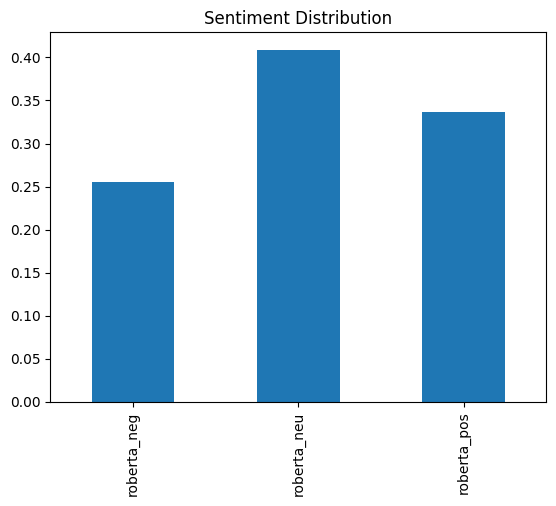

In [11]:
import matplotlib.pyplot as plt

# Calculate the mean of each sentiment category
sentiment_counts = df[['roberta_neg', 'roberta_neu', 'roberta_pos']].mean()

# Visualize sentiment distribution
sentiment_counts.plot(kind='bar')
plt.title('Sentiment Distribution')
plt.show()



In [12]:
invalid_dates = df[~pd.to_datetime(df['Comment Time'], errors='coerce').notnull()]
print(invalid_dates)


                                                   Title  \
18                      2014 fiat 500 sport 1.2 manifold   
19                                            Thank you"   
356                         Prices for UK 500 Announced!   
357                                                  NaN   
358                                          1.2 Pop Â£7   
...                                                  ...   
14553                                                NaN   
14554  The selected Fiat dealerships that will be dis...   
14555                                                NaN   
14556                                                NaN   
14557                                                â?   

                                                 Content  \
18     Hi all, I'm new to fiat 500's, fantastic cars,...   
19     I found a company that does them for 07-13, I ...   
356    Prices have FINALLY been announced for the 500...   
357                                    

<ipython-input-12-a46201c072d1>:2: FutureWarning: In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`
  invalid_dates = df[~pd.to_datetime(df['Comment Time'], errors='coerce').notnull()]


In [13]:
invalid_dates = df[~pd.to_datetime(df['Comment Time'], errors='coerce').notnull()]
print(invalid_dates[['Comment Time', 'Comment']])


                 Comment Time  \
18      I'm new to fiat 500's   
19                        NaN   
356                       NaN   
357                       NaN   
358                       NaN   
...                       ...   
14553                     NaN   
14554                     NaN   
14555                     NaN   
14556                     NaN   
14557                     NaN   

                                                 Comment  
18     Hi, Iâm looking for the same thing, there do...  
19                              2023-08-18T09:41:11+0100  
356    Mark Elvin said\n\n\n\n\nJive Blue 1.2 Pop - Â...  
357                                                  nan  
358                                                  nan  
...                                                  ...  
14553                                                nan  
14554                                                nan  
14555                                                nan  
14556        

<ipython-input-13-eb476155871f>:2: FutureWarning: In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`
  invalid_dates = df[~pd.to_datetime(df['Comment Time'], errors='coerce').notnull()]


This code filters the dataset to include only rows where the 'Comment Time' column can be successfully converted to a valid datetime format. It then converts the 'Comment Time' to a datetime object with UTC timezone awareness and sets this column as the DataFrame index.

In [14]:
df = df[pd.to_datetime(df['Comment Time'], errors='coerce').notnull()]
df['Comment Time'] = pd.to_datetime(df['Comment Time'], utc=True)
df.set_index('Comment Time', inplace=True)


<ipython-input-14-790a128ce5c5>:2: FutureWarning: In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`
  df = df[pd.to_datetime(df['Comment Time'], errors='coerce').notnull()]


This code interpolates missing sentiment scores over time to ensure a smooth trend line. It then creates a time series plot displaying the trends of positive, neutral, and negative sentiment scores. The X-axis is formatted to show each year, and the plot is customized with labels, a title, a legend, and a grid.

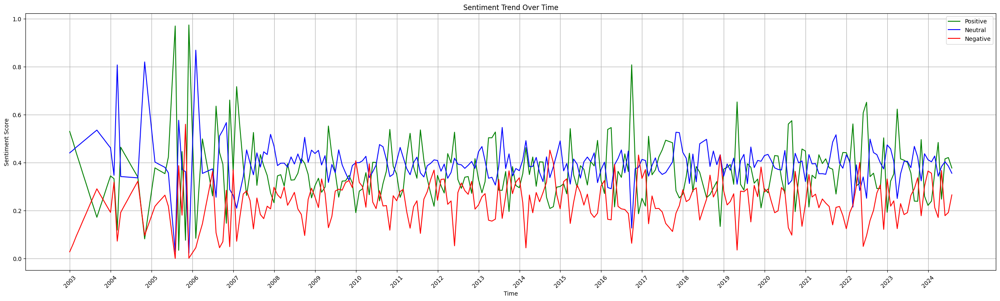

In [20]:
import matplotlib.pyplot as plt
import pandas as pd

# Interpolating missing values to avoid gaps in the plot
time_trend = time_trend.interpolate(method='linear')

# Creating the plot
plt.figure(figsize=(30, 8))
plt.plot(time_trend.index, time_trend['roberta_pos'], label='Positive', color='green')
plt.plot(time_trend.index, time_trend['roberta_neu'], label='Neutral', color='blue')
plt.plot(time_trend.index, time_trend['roberta_neg'], label='Negative', color='red')

# Formatting the X-axis to show each year
years = pd.date_range(start=time_trend.index.min(), end=time_trend.index.max(), freq='YS')
plt.xticks(years, years.year, rotation=45)

plt.title('Sentiment Trend Over Time')
plt.xlabel('Time')
plt.ylabel('Sentiment Score')
plt.legend(loc='best')
plt.grid(True)
plt.show()
